In [1]:
import torch
import os
from PIL import Image, ImageOps
from glob import glob
import numpy as np
import shutil
from zipfile import ZipFile
import random

# What is the zip file's name?
image_data_zip_file = "250_images.zip"

# What do you want to refer to the output as?
model_name = "yolov3_four_eyes"

# What share of the images should be in the training set?
percent_training = 0.80

add_mirror_images = True
add_salt_and_pepper = True
salt_and_peper_amounts = [0.05]

# Data augmentation functions
def create_salt_and_pepper(image_and_coord_path, amount = 0.01):
  image_path = image_and_coord_path[0]
  coord_path = image_and_coord_path[1]
  amount_percent = int(amount * 100)
  new_image_path = image_path.split(".")
  new_image_path[0] = new_image_path[0] + "_salt_and_pepper_" + str(amount_percent)
  new_image_path = ".".join(new_image_path)
  new_coord_path = coord_path.split(".")
  new_coord_path[0] = new_coord_path[0] + "_salt_and_pepper_" + str(amount_percent)
  new_coord_path = ".".join(new_coord_path)
  if not os.path.exists(new_image_path):
    image = Image.open(image_path)
    output = np.copy(np.array(image))
    # add salt
    nb_salt = np.ceil(amount * output.size * 0.5)
    coords = [np.random.randint(0, i - 1, int(nb_salt)) for i in output.shape]
    output[tuple(coords)] = 1 #output[coords] = 1
    # add pepper
    nb_pepper = np.ceil(amount* output.size * 0.5)
    coords = [np.random.randint(0, i - 1, int(nb_pepper)) for i in output.shape]
    output[tuple(coords)] = 0 #output[coords] = 0
    new_image = Image.fromarray(output)
    new_image.save(new_image_path, quality=100)
    shutil.copyfile(coord_path, new_coord_path)
  return new_image_path, new_coord_path
      

def create_mirror_image(image_and_coord_path):
  image_path = image_and_coord_path[0]
  coord_path = image_and_coord_path[1]
  # Create the mirror image file
  new_image_path = image_path.split(".")
  new_image_path[0] = new_image_path[0] + "_mirror"
  new_image_path = ".".join(new_image_path)
  # Create the bounding box coords of the mirrored image
  new_coord_path = coord_path.split(".")
  new_coord_path[0] = new_coord_path[0] + "_mirror"
  new_coord_path = ".".join(new_coord_path)
  if not os.path.exists(new_image_path):
    im = Image.open(image_path)
    im_mirror = ImageOps.mirror(im)
    im_mirror.save(new_image_path, quality=100)
    f = open(new_coord_path, "w")
    for line in open(coord_path):
      line_parts = line.split(" ")
      line_parts[1] = str(1 - float(line_parts[1]))
      new_line = " ".join(line_parts)
      f.write(new_line)
    f.close()
  return new_image_path, new_coord_path


print('PyTorch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

PyTorch 1.6.0+cu101 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


# Setup the Environment

In [2]:
!git clone https://github.com/NVIDIA/apex
%cd apex
!pip install -v --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" ./
%cd /content

Cloning into 'apex'...
remote: Enumerating objects: 1, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 7456 (delta 0), reused 0 (delta 0), pack-reused 7455
Receiving objects: 100% (7456/7456), 13.91 MiB | 12.16 MiB/s, done.
Resolving deltas: 100% (5036/5036), done.
/content/apex
/usr/local/lib/python3.6/dist-packages/pip/_internal/commands/install.py:283: UserWarning: Disabling all use of wheels due to the use of --build-options / --global-options / --install-options.
  cmdoptions.check_install_build_global(options)
Created temporary directory: /tmp/pip-ephem-wheel-cache-x76i25rd
Created temporary directory: /tmp/pip-req-tracker-auza1d7z
Created requirements tracker '/tmp/pip-req-tracker-auza1d7z'
Created temporary directory: /tmp/pip-install-p1owj1n1
Processing /content/apex
  Created temporary directory: /tmp/pip-req-build-q8ryompv
  Added file:///content/apex to build tracker '/tmp/pip-req-tracker-auza1d7z'
    Running setup.py (path:/tmp/pip-req-build-q8ryompv/setup

In [3]:

!git clone https://github.com/ultralytics/yolov3  # clone
%cd yolov3
!pip install -r requirements.txt
%cd ..

Cloning into 'yolov3'...
remote: Enumerating objects: 9449, done.
remote: Total 9449 (delta 0), reused 0 (delta 0), pack-reused 9449
Receiving objects: 100% (9449/9449), 7.82 MiB | 9.09 MiB/s, done.
Resolving deltas: 100% (6475/6475), done.
/content/yolov3
     |████████████████████████████████| 276kB 8.9MB/s 
  Created wheel for PyYAML: filename=PyYAML-5.3.1-cp36-cp36m-linux_x86_64.whl size=44619 sha256=77f759a740a96ff7f23e81fc365787c86681d565088a6170af39b93a5e1a9527
  Stored in directory: /root/.cache/pip/wheels/a7/c1/ea/cf5bd31012e735dc1dfea3131a2d5eae7978b251083d6247bd
Successfully built PyYAML
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
/content


In [4]:
!ln -s /content/drive/My\ Drive/ /mydrive

In [5]:
# Copy zip file from google drive
shutil.copyfile("/mydrive/"+image_data_zip_file, image_data_zip_file)
# Unzip the file to raw_data
zf = ZipFile(image_data_zip_file, "r")
zf.extractall("raw_data")
zf.close()
# Copy the config files
shutil.copyfile("/mydrive/yolov3/train.cfg", "yolov3/cfg/train.cfg")
shutil.copyfile("/mydrive/yolov3/test.cfg", "yolov3/cfg/test.cfg")
# Copy the class labels
shutil.copyfile("raw_data/obj.names", "yolov3/data/obj.names")


'yolov3/data/obj.names'

# Augment the Image Data

In [6]:
record_ids = {} # holds the record ids (used to split data into training and test sets)
data = {} # Holds image path and labels file path
image_count = 0
for line in open("raw_data/obj.names"): 
    line = line.strip()
    the_record_ids = set()
    print("Processing " + line + "...")
    the_directory = line.replace(" ", "_")
    coords = labels = glob("raw_data/" + the_directory + "/*.txt")
    for coords_path in coords:
      if "_mirror" not in coords_path and "_salt" not in coords_path:
        image_count += 1
        record_id = int(coords_path.split("/")[-1].split(".txt")[0])
        the_record_ids.add(str(record_id))
        # Find the image file
        pattern = "raw_data/" + the_directory + "/*" + str(record_id) + ".j*"
        image_path = [x for x in glob(pattern) if x not in coords_path][0]
        data[str(record_id)] = (image_path, coords_path)
        if add_mirror_images:
          image_count += 1
          mirror_record_id = str(record_id) + "_mirror"
          new_image_path, new_coords_path = create_mirror_image(data[str(record_id)])
          data[mirror_record_id] = (new_image_path, new_coords_path)
          the_record_ids.add(mirror_record_id)
    record_ids[line] = the_record_ids
print(str(image_count) + " images ready")
  

Processing Poison Ivy...
Processing Virginia Creeper...
Processing Bramble...
Processing Box Elder...
2000 images ready


In [7]:
if add_salt_and_pepper:
  for amount in salt_and_peper_amounts:
    for line in open("raw_data/obj.names"):
      line = line.strip()
      print("Processing " + line + "...")
      the_directory = line.strip().replace(" ", "_")
      the_record_ids = record_ids[line]
      for record_id in the_record_ids.copy():
        salt_and_peper_record_id = record_id + "_salt_and_pepper_" + str(int(amount * 100))
        the_record_ids.add(salt_and_peper_record_id)
        data[salt_and_peper_record_id] = create_salt_and_pepper(data[record_id], amount)
        image_count += 1
      record_ids[line] = the_record_ids
print(str(image_count) + " images ready")

Processing Poison Ivy...
Processing Virginia Creeper...
Processing Bramble...
Processing Box Elder...
4000 images ready


# Train Test Split

In [8]:
!mkdir yolov3/data/training
!mkdir yolov3/data/test

In [9]:
random.seed(42)
training_image_paths = set()
test_image_paths = set()
for line in open("raw_data/obj.names"): 
    line = line.strip()
    the_record_ids = record_ids[line]
    n_train = int(round(len(the_record_ids) * percent_training, 0))
    for_training = random.sample(list(the_record_ids), n_train)
    for_testing = np.setdiff1d(list(the_record_ids), for_training)
    for i in for_training:
      for file_path in data[i]:
        new_file_path = file_path.split("/")
        new_file_path = "yolov3/data/training/" + new_file_path[-1]
        shutil.move(file_path, new_file_path)
        if "jpg" in new_file_path:
          training_image_paths.add(new_file_path)
    for i in for_testing:
      for file_path in data[i]:
        new_file_path = file_path.split("/")
        new_file_path = "yolov3/data/test/" + new_file_path[-1]
        shutil.move(file_path, new_file_path)
        if "jpg" in new_file_path:
          test_image_paths.add(new_file_path)



# Finalize the Config Files

In [10]:
n_classes = 0
for line in open("raw_data/obj.names"):
  n_classes += 1

f = open("yolov3/data/obj.data", "w")
f.write("classes=" + str(n_classes) + "\n")
f.write("train=data/training.txt\n")
f.write("valid=data/test.txt\n")
f.write("names=data/obj.names")
f.close()

In [11]:
f = open("/content/yolov3/data/training.txt", "w")
for training_image_path in training_image_paths:
  training_image_path = training_image_path.replace("yolov3/data/", "./")
  f.write(training_image_path + "\n")
f.close()

In [12]:
f = open("/content/yolov3/data/test.txt", "w")
for test_image_path in test_image_paths:
  test_image_path = test_image_path.replace("yolov3/data", "./")
  f.write(test_image_path + "\n")
f.close()

# Train the Model
```
var keep_alive = false;

function ClickConnect(){
  if (keep_alive){
    console.log("Working"); 
    document
      .querySelector('#top-toolbar > colab-connect-button')
      .shadowRoot.querySelector('#connect')
      .click();
  }
}
setInterval(ClickConnect,60000);
```

In [13]:
%cd yolov3
!python3 train.py --cfg train.cfg --data data/obj.data --weights yolov3-spp-ultralytics.pt --cache

/content/yolov3
Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./cfg/train.cfg', data='data/obj.data', device='', epochs=300, evolve=False, freeze_layers=False, img_size=[320, 640], multi_scale=False, name='', nosave=False, notest=False, rect=False, resume=False, single_cls=False, weights='yolov3-spp-ultralytics.pt')
Using CUDA Apex device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Start Tensorboard with "tensorboard --logdir=runs", view at http://localhost:6006/
2020-10-31 18:34:04.670490: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Model Summary: 225 layers, 6.25895e+07 parameters, 6.25895e+07 gradients
Optimizer groups: 76 .bias, 76 Conv2d.weight, 73 other
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   408    0   408    0     0   1593     

In [14]:
!python3 test.py --cfg test.cfg --data data/obj.data --weights weights/last.pt

Namespace(augment=False, batch_size=16, cfg='./cfg/test.cfg', conf_thres=0.001, data='data/obj.data', device='', img_size=512, iou_thres=0.6, save_json=False, single_cls=False, task='test', weights='weights/last.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Model Summary: 225 layers, 6.25895e+07 parameters, 6.25895e+07 gradients
Fusing layers...
Model Summary: 152 layers, 6.25627e+07 parameters, 6.25627e+07 gradients
Caching labels data/test.txt (800 found, 0 missing, 0 empty, 0 duplicate, for 800 images): 100% 800/800 [00:00<00:00, 1263.39it/s]
               Class    Images   Targets         P         R   mAP@0.5        F1:   0% 0/50 [00:00<?, ?it/s]/content/yolov3/utils/utils.py:512: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  i, j = (x[:, 5:] > conf

In [15]:
!python3 test.py --cfg test.cfg --data data/obj.data --weights weights/best.pt

Namespace(augment=False, batch_size=16, cfg='./cfg/test.cfg', conf_thres=0.001, data='data/obj.data', device='', img_size=512, iou_thres=0.6, save_json=False, single_cls=False, task='test', weights='weights/best.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Model Summary: 225 layers, 6.25895e+07 parameters, 6.25895e+07 gradients
Fusing layers...
Model Summary: 152 layers, 6.25627e+07 parameters, 6.25627e+07 gradients
Caching labels data/test.txt (800 found, 0 missing, 0 empty, 0 duplicate, for 800 images): 100% 800/800 [00:00<00:00, 9305.45it/s]
               Class    Images   Targets         P         R   mAP@0.5        F1:   0% 0/50 [00:00<?, ?it/s]/content/yolov3/utils/utils.py:512: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  i, j = (x[:, 5:] > conf

In [16]:
os.mkdir("/mydrive/yolov3/" + model_name)
shutil.copy("/content/yolov3/results.txt", "/mydrive/yolov3/" + model_name + "/results.txt")
shutil.copy("/content/yolov3/weights/last.pt", "/mydrive/yolov3/" + model_name + "/last.pt")
shutil.copy("/content/yolov3/weights/best.pt", "/mydrive/yolov3/" + model_name + "/best.pt")


'/mydrive/yolov3/yolov3_four_eyes/best.pt'

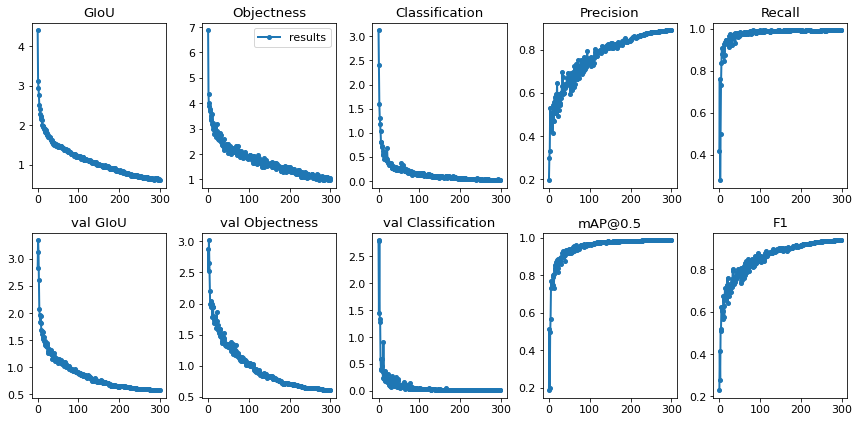

In [17]:
from utils import utils
utils.plot_results() 

In [18]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>